# 01 — Functional-to-anatomy registration review

Review how each functional plane sits on the anatomy image. This notebook only reads existing files.

In [1]:
# 02 — Load the review tools
from pathlib import Path
from IPython.display import display
from codeants_2pf_hcr.qc_notebooks import QCNotebookConfig, build_qc_stage_inventory, resolve_qc_notebook_context, write_qc_review_record
from codeants_2pf_hcr.plots.qc_functional import load_functional_registration_qc, render_functional_registration_all_planes, render_functional_registration_artifacts

## 03 — Choose the data to review

Choose the folder that contains the fish and the exact saved run to review.

In [2]:
# 04 — Set the fish and saved run
FISH_ID = "L765_f04"
LOCAL_ROOT = Path("/Volumes/dataDrive/dataProcessing/2p_processing")
PIPELINE_ROOT = Path("/Volumes/dataDrive/dataProcessing/2p_processing/_staged_pipeline_runs/20260803T112035Z_functional_registration_ants_no_fallback/L765_f04")
CONFIG = QCNotebookConfig(fish_id=FISH_ID, local_root=LOCAL_ROOT, pipeline_root=PIPELINE_ROOT)
CONTEXT = resolve_qc_notebook_context(CONFIG)

In [3]:
# 05 — Check that the registration files are available
STAGES = ["prepare-in-vivo-anatomy-stack", "register-functional-to-anatomy", "transform-functional-rois-to-anatomy", "make-functional-registration-qc"]
STAGE_INVENTORY = build_qc_stage_inventory(CONTEXT)
display(STAGE_INVENTORY[STAGE_INVENTORY["stage_name"].isin(STAGES)])

,stage_name,stage_root,stage_root_exists,manifest_path,manifest_exists,manifest_status,artifact_count,artifact_exists_count,required_artifacts_exist,artifact_paths
1,prepare-in-vivo-anatomy-stack,/Volumes/dataDrive/dataProcessing/2p_processin...,False,/Volumes/dataDrive/dataProcessing/2p_processin...,False,None,0,0,False,()
9,register-functional-to-anatomy,/Volumes/dataDrive/dataProcessing/2p_processin...,True,/Volumes/dataDrive/dataProcessing/2p_processin...,True,pass,9,7,True,(/Volumes/dataDrive/dataProcessing/2p_processi...
10,transform-functional-rois-to-anatomy,/Volumes/dataDrive/dataProcessing/2p_processin...,True,/Volumes/dataDrive/dataProcessing/2p_processin...,True,pass,21,21,True,(/Volumes/dataDrive/dataProcessing/2p_processi...
11,make-functional-registration-qc,/Volumes/dataDrive/dataProcessing/2p_processin...,True,/Volumes/dataDrive/dataProcessing/2p_processin...,True,pass,9,9,True,(/Volumes/dataDrive/dataProcessing/2p_processi...


## 06 — Load the saved evidence

The registration tables, transformed ROI labels, and review figures must all be present. Missing files stop the review; this notebook does not create replacements.

In [4]:
# 07 — Load registration, labels, and review figures
REGISTRATION_QC = load_functional_registration_qc(
    fish_id=CONTEXT.fish_id,
    anatomy_preparation_manifest_path=CONTEXT.manifest_paths["prepare-in-vivo-anatomy-stack"],
    anatomy_stack_path=CONTEXT.fish_dir / "02_reg" / "00_preprocessing" / "2p_anatomy" / f"{CONTEXT.fish_id}_anatomy_2P_GCaMP.nrrd",
    registration_manifest_path=CONTEXT.manifest_paths["register-functional-to-anatomy"],
    roi_transform_manifest_path=CONTEXT.manifest_paths["transform-functional-rois-to-anatomy"],
    qc_manifest_path=CONTEXT.manifest_paths["make-functional-registration-qc"],
    registration_root=CONTEXT.stage_paths["register-functional-to-anatomy"],
    transformed_roi_root=CONTEXT.stage_paths["transform-functional-rois-to-anatomy"],
    qc_root=CONTEXT.stage_paths["make-functional-registration-qc"],
)
display(REGISTRATION_QC["manifest_inventory"])
display(REGISTRATION_QC["transforms"])
display(REGISTRATION_QC["ncc_profiles"])

,artifact,path,status,generated_at
0,anatomy preparation,/Volumes/dataDrive/dataProcessing/2p_processin...,legacy_unmanifested,None
1,functional registration,/Volumes/dataDrive/dataProcessing/2p_processin...,pass,2026-08-03T11:49:34.030497+00:00
2,functional ROI transform,/Volumes/dataDrive/dataProcessing/2p_processin...,pass,2026-08-03T11:49:36.686875+00:00
3,functional registration QC,/Volumes/dataDrive/dataProcessing/2p_processin...,pass,2026-08-03T11:49:49.673812+00:00


,plane_index,label,best_z,scale,tform_src,ncc_xy_x0,ncc_xy_y0,ncc_xy_score
0,0,L765_f04_plane0_mcorrected_flipX,30,1.1575,ants_rigid_affine,80,82,0.685872
1,1,L765_f04_plane1_mcorrected_flipX,27,1.1595,ants_rigid_affine,76,72,0.675368
2,2,L765_f04_plane2_mcorrected_flipX,24,1.1635,ants_rigid_affine,60,55,0.670769
3,3,L765_f04_plane3_mcorrected_flipX,18,1.1709,ants_rigid_affine,45,32,0.635664
4,4,L765_f04_plane4_mcorrected_flipX,14,1.1729,ants_rigid_affine,31,15,0.620860
5,5,L765_f04_plane5_mcorrected_flipX,17,1.1709,ants_rigid_affine,73,77,0.738812
6,6,L765_f04_plane6_mcorrected_flipX,15,1.1690,ants_rigid_affine,69,68,0.711450
7,7,L765_f04_plane7_mcorrected_flipX,11,1.1749,ants_rigid_affine,58,46,0.677205
8,8,L765_f04_plane8_mcorrected_flipX,6,1.1827,ants_rigid_affine,42,26,0.680313
9,9,L765_f04_plane9_mcorrected_flipX,2,1.1965,ants_rigid_affine,28,5,0.664833


,plane_idx,plane_label,best_z,best_ncc,n_z
0,0,L765_f04_plane0_mcorrected_flipX,30,0.685872,52
1,1,L765_f04_plane1_mcorrected_flipX,27,0.675368,52
2,2,L765_f04_plane2_mcorrected_flipX,24,0.670769,52
3,3,L765_f04_plane3_mcorrected_flipX,18,0.635664,52
4,4,L765_f04_plane4_mcorrected_flipX,14,0.620860,52
5,5,L765_f04_plane5_mcorrected_flipX,17,0.738812,52
6,6,L765_f04_plane6_mcorrected_flipX,15,0.711450,52
7,7,L765_f04_plane7_mcorrected_flipX,11,0.677205,52
8,8,L765_f04_plane8_mcorrected_flipX,6,0.680313,52
9,9,L765_f04_plane9_mcorrected_flipX,2,0.664833,52


## 08 — Review all planes

Each panel shows the transformed ROI outlines over the matching anatomy plane. Review the complete set before judging registration quality.

,plane_index,label,best_z,scale,tform_src,ncc_xy_x0,ncc_xy_y0,ncc_xy_score
0,0,L765_f04_plane0_mcorrected_flipX,30,1.1575,ants_rigid_affine,80,82,0.685872
1,1,L765_f04_plane1_mcorrected_flipX,27,1.1595,ants_rigid_affine,76,72,0.675368
2,2,L765_f04_plane2_mcorrected_flipX,24,1.1635,ants_rigid_affine,60,55,0.670769
3,3,L765_f04_plane3_mcorrected_flipX,18,1.1709,ants_rigid_affine,45,32,0.635664
4,4,L765_f04_plane4_mcorrected_flipX,14,1.1729,ants_rigid_affine,31,15,0.620860
5,5,L765_f04_plane5_mcorrected_flipX,17,1.1709,ants_rigid_affine,73,77,0.738812
6,6,L765_f04_plane6_mcorrected_flipX,15,1.1690,ants_rigid_affine,69,68,0.711450
7,7,L765_f04_plane7_mcorrected_flipX,11,1.1749,ants_rigid_affine,58,46,0.677205
8,8,L765_f04_plane8_mcorrected_flipX,6,1.1827,ants_rigid_affine,42,26,0.680313
9,9,L765_f04_plane9_mcorrected_flipX,2,1.1965,ants_rigid_affine,28,5,0.664833


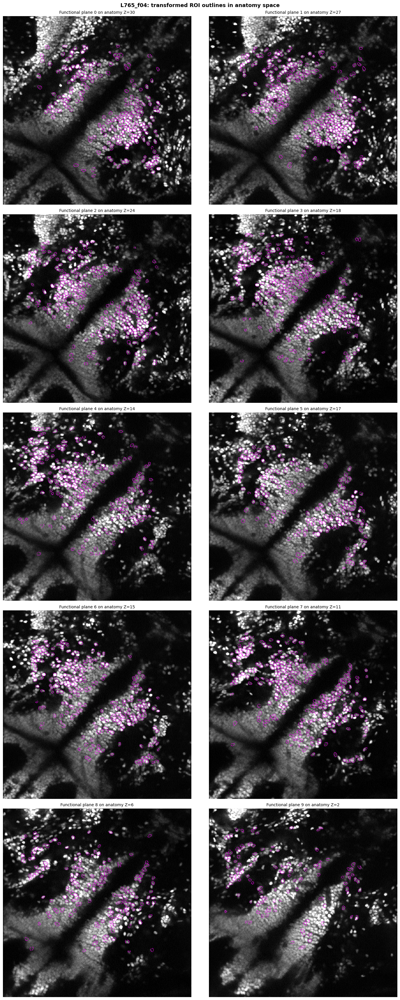

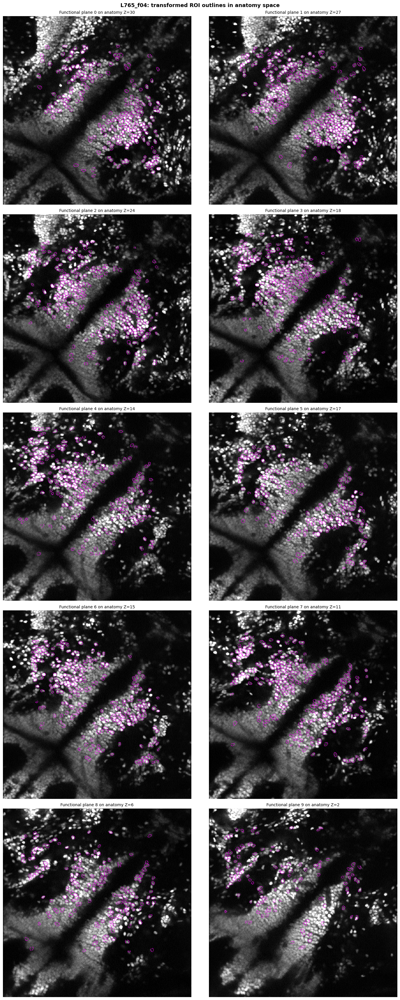

In [5]:
# 09 — Display all anatomy-space ROI overlays
display(REGISTRATION_QC['transforms'].sort_values('plane_index'))
render_functional_registration_all_planes(REGISTRATION_QC)

## 10 — Review overlays and matching profiles

Open each saved figure at a useful size. The matching profile helps interpretation but does not replace visual review.

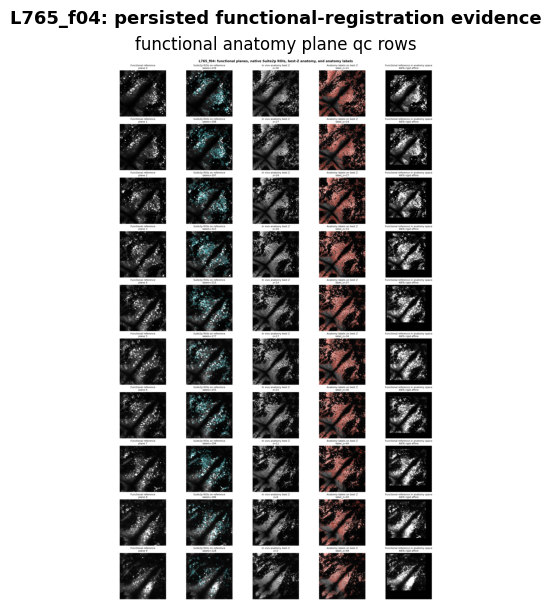

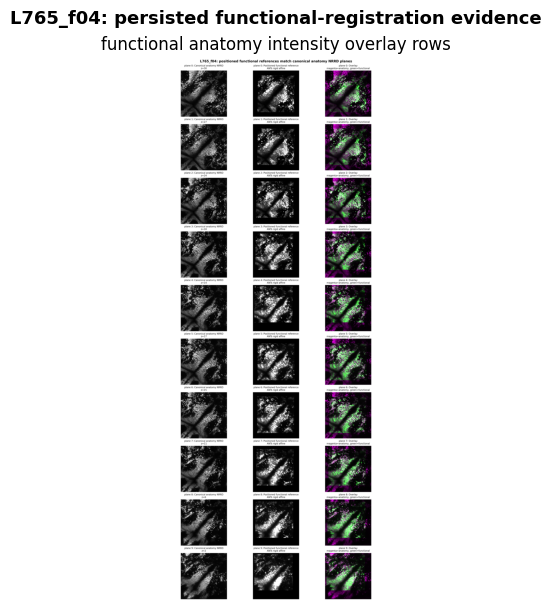

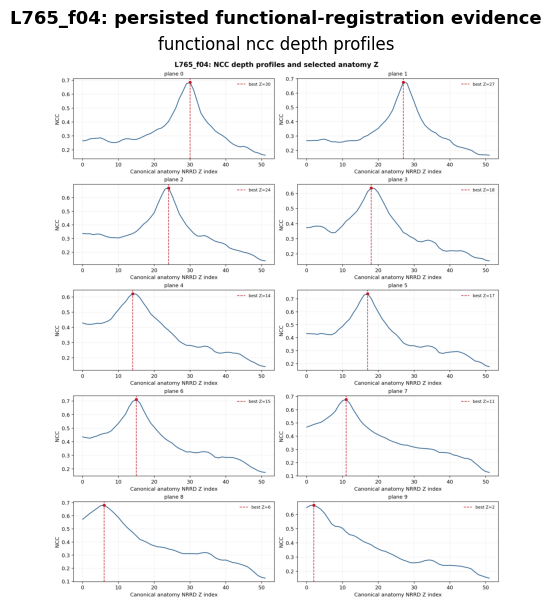

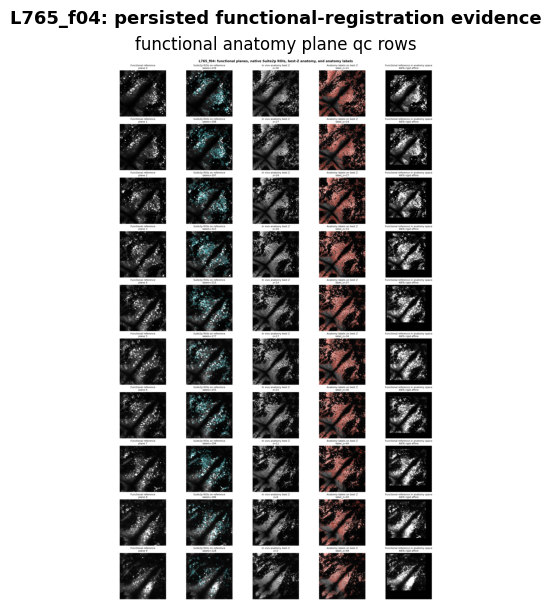

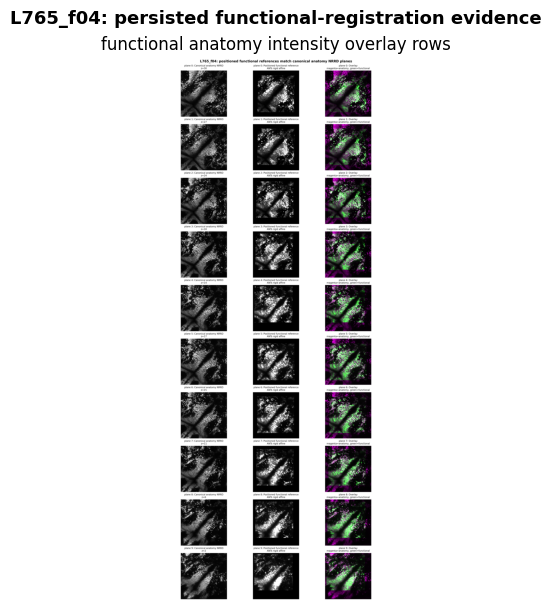

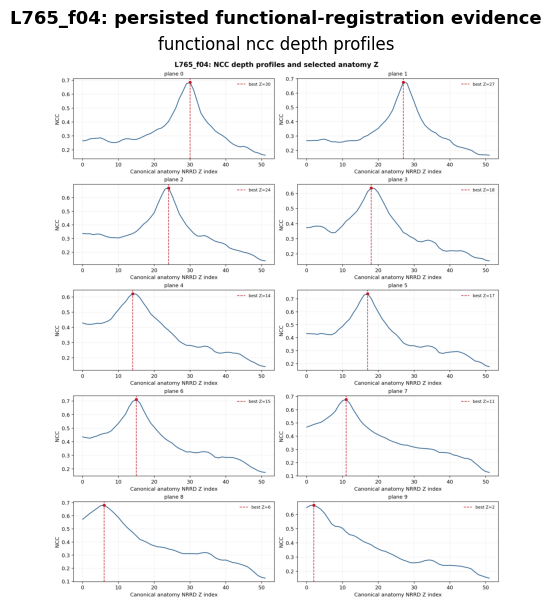

In [6]:
# 11 — Display registration figures separately
DISPLAY_ARTIFACTS = [
    "functional_anatomy_plane_qc_rows.png",
    "functional_anatomy_intensity_overlay_rows.png",
    "functional_ncc_depth_profiles.png",
]
for artifact_name in DISPLAY_ARTIFACTS:
    display(render_functional_registration_artifacts(REGISTRATION_QC, artifact_names=[artifact_name]))

## 12 — Save an optional review note

Saving records what you reviewed. It does not accept or replace any result. Use `NOTES` for plane-specific concerns.

In [7]:
# 13 — Set the optional review note
SAVE_REVIEW = False
REVIEWER = ""
DECISION = "computed_unreviewed"
NOTES = ""
REVIEW_PATH = write_qc_review_record(
    CONTEXT,
    stage_name="make-functional-registration-qc",
    decision=DECISION,
    reviewer=REVIEWER,
    reviewed_artifacts=REGISTRATION_QC["qc_artifact_paths"],
    notes=NOTES,
) if SAVE_REVIEW else None
REVIEW_PATH